In [5]:
# NEED TO USE predictors_simple kernel to be able to load the modles
import numpy as np
import pandas as pd
import tensorflow as tf # tested on version 2.2.0
import matplotlib
matplotlib.rcParams['figure.dpi'] = 100
matplotlib.rcParams['font.sans-serif'] = 'Arial'
from matplotlib import pyplot as plt
from joblib import load
from scipy.stats import spearmanr, pearsonr
from sklearn.metrics import precision_recall_curve, roc_curve
from sklearn.metrics import auc
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
import seaborn as sns

import os

os.chdir("/Users/claireleblanc/Documents/grad_school/staller_lab/NN_interpretability_for_AD_prediction/Model")
from ADModel_act import ADModel_act
from ADModel_abund import ADModel_abund
from ADModel_three_state import ADModel_three_state_abund, ADModel_three_state
from ADModel_two_state import ADModel_two_state_abund, ADModel_two_state
from Data import DataReader, SplitData, FastTensorDataLoader, one_hot_encode

os.chdir("/Users/claireleblanc/Documents/tools_software/PADDLE")

import paddle
import os

os.chdir("/Users/claireleblanc/Documents/tools_software/adhunter")
from actpred.models import ActCNNSystem

# Set Numpy to display floats with 3 decimal places
np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})

os.chdir("/Users/claireleblanc/Documents/grad_school/staller_lab/NN_interpretability_for_AD_prediction")

In [6]:
import matplotlib 
# For higher resoltion figures
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.rcParams["font.family"] = "Helvetica" #somethings this one doesnt work
plt.rcParams['pdf.fonttype'] = 42

In [7]:
tile_data = pd.read_csv("/Users/claireleblanc/Documents/grad_school/staller_lab/Data/pm_gcn4_sort2_pools_allchannels_wrangled_w_ratio.csv")

In [8]:
tile_data

,aa_seq,activity,abundance,ratio
0,LQDFVLFDQPIRPHRQHNRNALQPPTRGINLNQQHRSQHL,270.500000,2275.157246,23705.971880
1,DLFGGLESSTPWIREQERIHLQYVEGLRWVTWGQMGHVEL,478.640464,4281.992228,7965.856073
2,VEHSPAEKSDDLEVVEPTSGHQRRKSGTSPPSGRHSSVSG,1081.420642,3180.013344,18161.451312
3,NAGTASRFLTTVVALCSPSDVSSTVLTGNARMQVRPIGPL,603.933187,1160.105019,52119.378755
4,QQQHRPHSTLQASSASPIQNPRVSDLSQDTGSIASSTSPQ,425.945104,3136.116978,19044.671497
...,...,...,...,...
17727,LYDESPDFGSGFDVSPNFAGSDFDAGGNDVWFPLFPQSNT,8178.009196,3209.784417,262143.000000
17728,HANRGPDFDALFDLTANSFVDGLDAASLAMFDTQQLDKVQ,9064.000000,4649.000000,262143.000000
17729,LYESPDFGYDVSPGFGSNDFDTGSNQWFSLFPDQSTTPDA,9064.000000,4649.000000,262143.000000
17730,TPNIPQEFFDFTEGFGEEFTDSTMLSPHLVPTGIMASKDS,4862.343223,111.000000,262143.000000


In [11]:
# BIOPHYSICAL MODEL STUFF
import torch

size = (1,40,20)
positive = False
activity_fun = "Hill"
hill_value = 1
relu = False
kernel_size = 40
outchannel = 1
# model = "../Ablations/ablation_data/two-state_abundmodel_b10_e200_L0.0001_sMinMax_aHill_c1_k40_abundk15_noMax_ParaReLU_0.1PosKLoss_0.1PosWeightLoss_1actLoss_hSplit_hv1"

model = "model_data/two_state_abundmodel_b10_e200_L0.0001_sMinMax_aHill_c1_k40_ak20_ParaReLU_0.1PosKLoss_0.1PosWeightLoss_1actLoss_hSplit_hv1_seed5273682_weightInit"
two_state_biophysical_model = ADModel_two_state_abund(size,activity_fun, kernel_size, relu=False, abund_k=20)
two_state_biophysical_model.load_state_dict(torch.load(f"{model}.pth"))

two_state_biophysical_model.eval()
sc_act = load("Model/scaler_activity.bin")
sc_abund = load("Model/scaler_activity.bin")


def run_biophysical_model(loaded_model,sequence):
    encoded_seq = one_hot_encode(sequence).reshape(1,1,40,20)
    seq_tensor = torch.from_numpy(encoded_seq).type(torch.FloatTensor)
    predictions = loaded_model(seq_tensor)
    predictions_act = sc_act.inverse_transform(predictions.detach().numpy().reshape(-1)[1].reshape(1,-1))
    predictions_abund = sc_abund.inverse_transform(predictions.detach().numpy().reshape(-1)[0].reshape(1,-1))
    k1, _ = loaded_model.get_ks()
    return predictions_abund[0][0], predictions_act[0][0], k1.detach().numpy()[0][0]

/Users/claireleblanc/miniconda3/envs/predictors_simple/lib/python3.10/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.4.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [12]:
tile_data["pred_activity"] = [run_biophysical_model(two_state_biophysical_model, seq)[1] for seq in tile_data['aa_seq']]
tile_data["pred_abund"] = [run_biophysical_model(two_state_biophysical_model, seq)[0] for seq in tile_data['aa_seq']]
tile_data["K1"] = [run_biophysical_model(two_state_biophysical_model, seq)[2] for seq in tile_data['aa_seq']]

Text(0.5, 1.0, 'Spearman: 0.727, Pearson: 0.778')

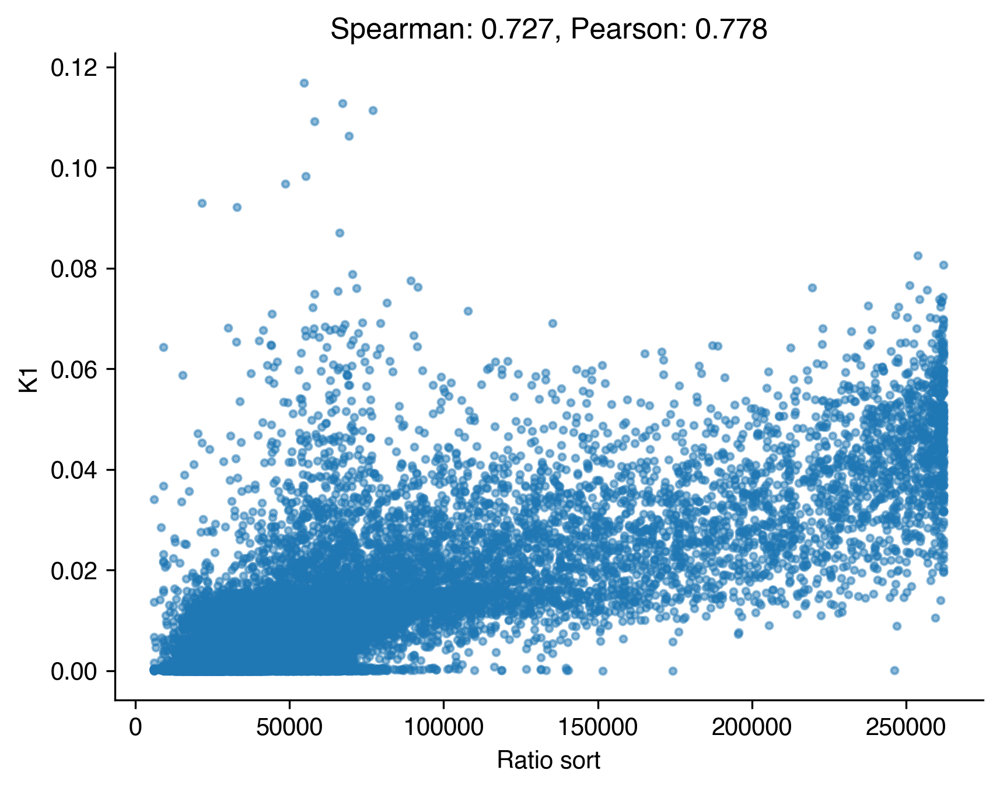

In [13]:
plt.scatter(tile_data['ratio'], tile_data["K1"], s=8, alpha=0.5)
spearman = spearmanr(tile_data["ratio"], tile_data["K1"]).correlation
pearson = pearsonr(tile_data["ratio"], tile_data["K1"]).correlation

plt.xlabel("Ratio sort")
plt.ylabel("K1")
sns.despine()
plt.title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

Text(0.5, 1.0, 'Spearman: -0.14, Pearson: -0.306')

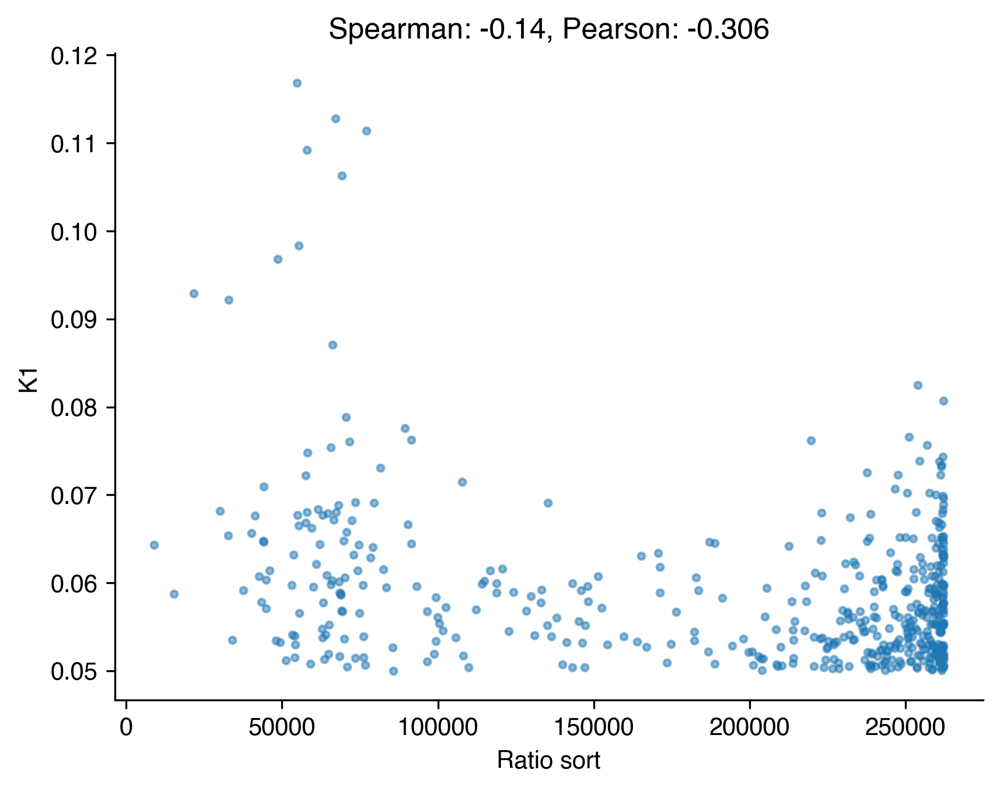

In [14]:
subset = tile_data[tile_data["K1"] > 0.05]

plt.scatter(subset['ratio'], subset["K1"], s=8, alpha=0.5)
spearman = spearmanr(subset["ratio"], subset["K1"]).correlation
pearson = pearsonr(subset["ratio"], subset["K1"]).correlation

plt.xlabel("Ratio sort")
plt.ylabel("K1")
sns.despine()
plt.title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

Text(0.5, 1.0, 'Spearman: 0.947, Pearson: 0.84')

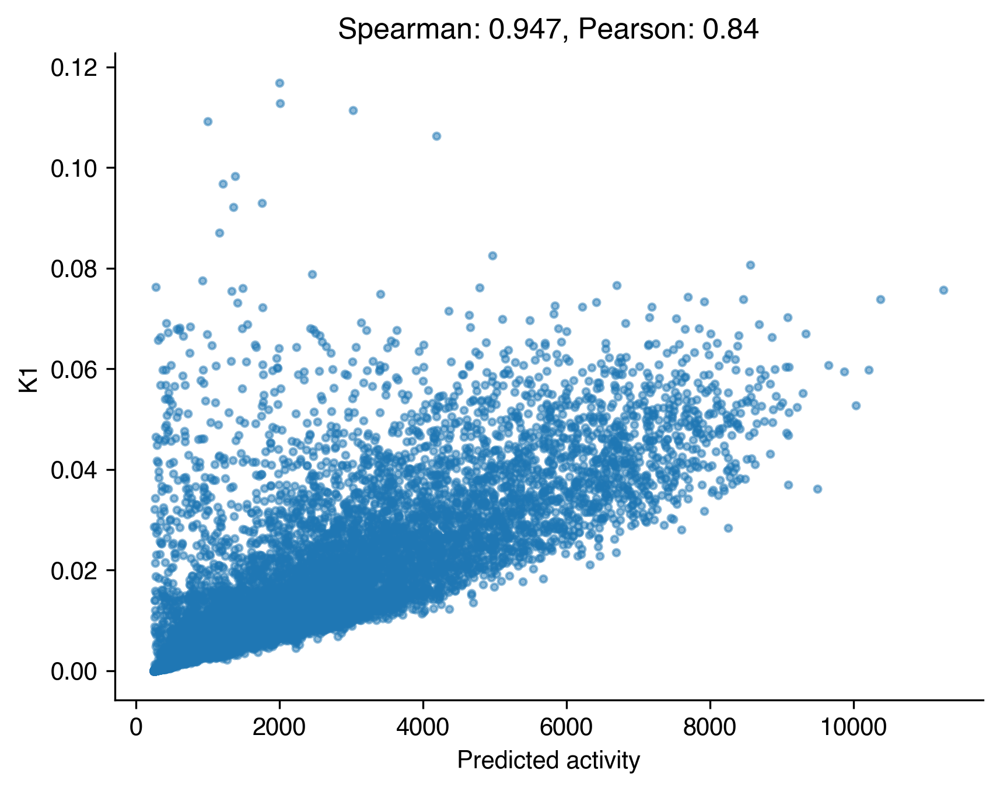

In [15]:
plt.scatter(tile_data['pred_activity'], tile_data["K1"], s=8, alpha=0.5)
spearman = spearmanr(tile_data["pred_activity"], tile_data["K1"]).correlation
pearson = pearsonr(tile_data["pred_activity"], tile_data["K1"]).correlation

plt.xlabel("Predicted activity")
plt.ylabel("K1")
sns.despine()
plt.title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

Text(0.5, 1.0, 'Spearman: -0.213, Pearson: -0.292')

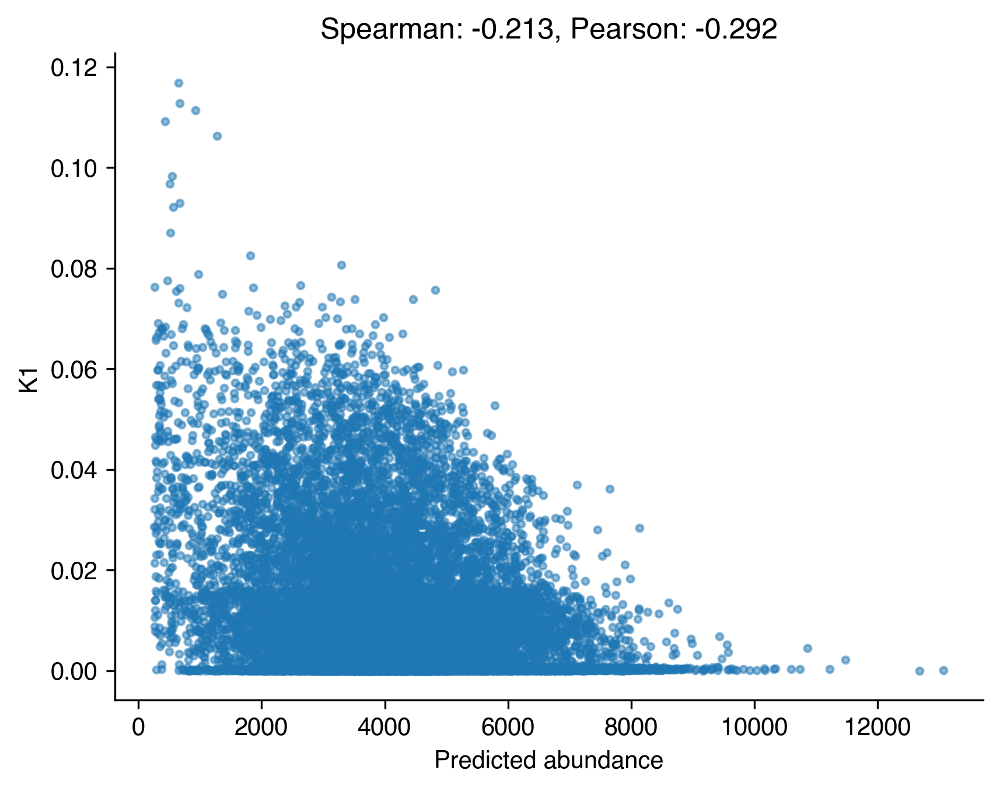

In [16]:
plt.scatter(tile_data['pred_abund'], tile_data["K1"], s=8, alpha=0.5)
spearman = spearmanr(tile_data["pred_abund"], tile_data["K1"]).correlation
pearson = pearsonr(tile_data["pred_abund"], tile_data["K1"]).correlation

plt.xlabel("Predicted abundance")
plt.ylabel("K1")
sns.despine()
plt.title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

Text(0.5, 1.0, 'Spearman: 0.0326, Pearson: 0.0467')

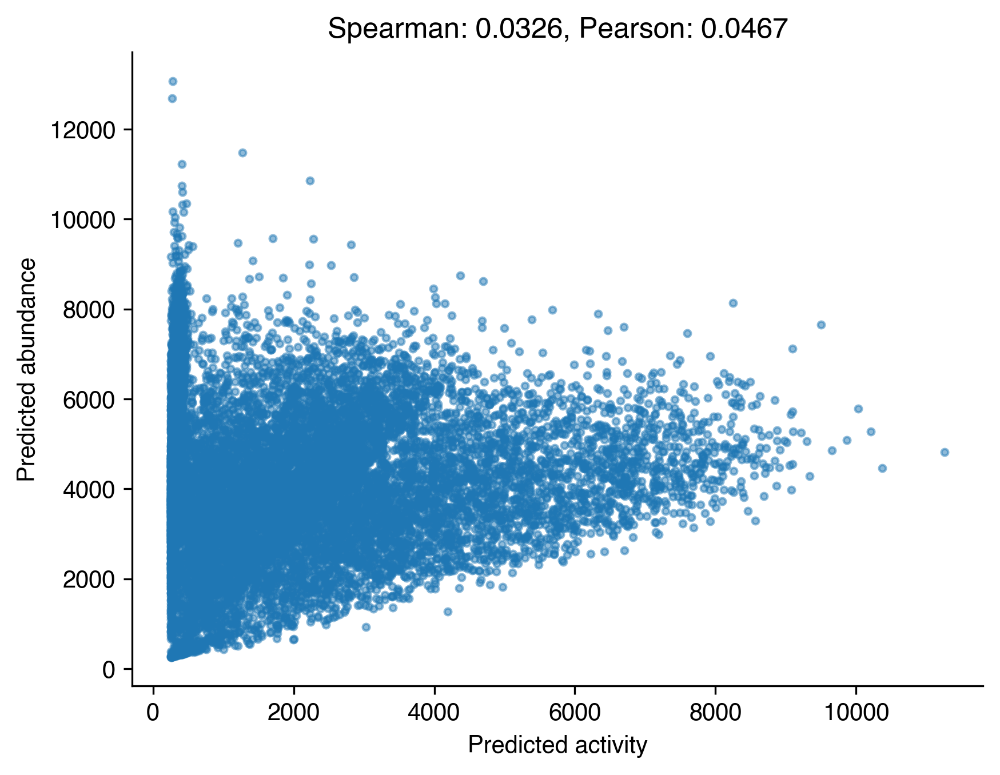

In [17]:
plt.scatter(tile_data['pred_activity'], tile_data["pred_abund"], s=8, alpha=0.5)
spearman = spearmanr(tile_data["pred_activity"], tile_data["pred_abund"]).correlation
pearson = pearsonr(tile_data["pred_activity"], tile_data["pred_abund"]).correlation

plt.xlabel("Predicted activity")
plt.ylabel("Predicted abundance")
sns.despine()
plt.title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

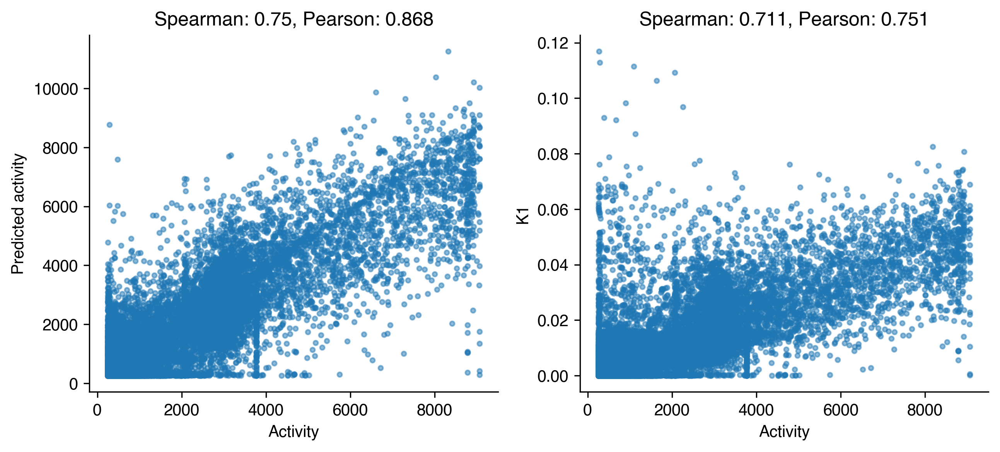

In [18]:
fig, axs = plt.subplots(1,2, figsize=(10,4))

axs[0].scatter(tile_data['activity'], tile_data["pred_activity"], s=8, alpha=0.5)
spearman = spearmanr(tile_data["activity"], tile_data["pred_activity"]).correlation
pearson = pearsonr(tile_data["activity"], tile_data["pred_activity"]).correlation

axs[0].set_xlabel("Activity")
axs[0].set_ylabel("Predicted activity")
axs[0].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

axs[1].scatter(tile_data['activity'], tile_data["K1"], s=8, alpha=0.5)
spearman = spearmanr(tile_data["activity"], tile_data["K1"]).correlation
pearson = pearsonr(tile_data["activity"], tile_data["K1"]).correlation

axs[1].set_xlabel("Activity")
axs[1].set_ylabel("K1")
axs[1].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

sns.despine()

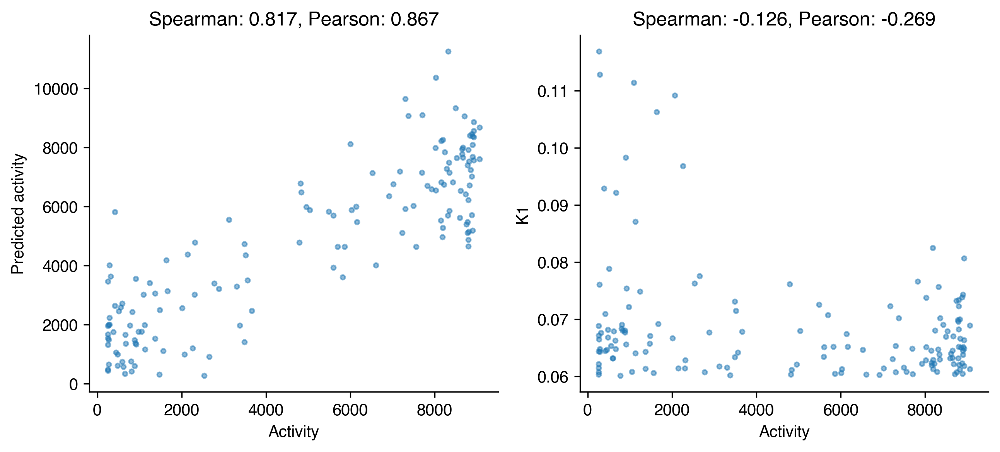

In [19]:
subset = tile_data[tile_data["K1"] > 0.06]

fig, axs = plt.subplots(1,2, figsize=(10,4))

axs[0].scatter(subset['activity'], subset["pred_activity"], s=8, alpha=0.5)
spearman = spearmanr(subset["activity"], subset["pred_activity"]).correlation
pearson = pearsonr(subset["activity"], subset["pred_activity"]).correlation

axs[0].set_xlabel("Activity")
axs[0].set_ylabel("Predicted activity")
axs[0].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

axs[1].scatter(subset['activity'], subset["K1"], s=8, alpha=0.5)
spearman = spearmanr(subset["activity"], subset["K1"]).correlation
pearson = pearsonr(subset["activity"], subset["K1"]).correlation

axs[1].set_xlabel("Activity")
axs[1].set_ylabel("K1")
axs[1].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

sns.despine()

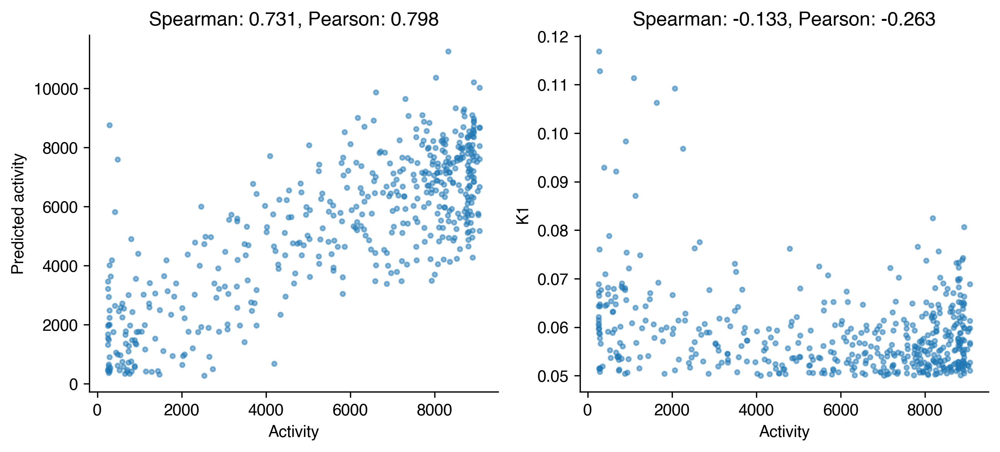

In [97]:
subset = tile_data[tile_data["K1"] > 0.05]

fig, axs = plt.subplots(1,2, figsize=(10,4))

axs[0].scatter(subset['activity'], subset["pred_activity"], s=8, alpha=0.5)
spearman = spearmanr(subset["activity"], subset["pred_activity"]).correlation
pearson = pearsonr(subset["activity"], subset["pred_activity"]).correlation

axs[0].set_xlabel("Activity")
axs[0].set_ylabel("Predicted activity")
axs[0].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

axs[1].scatter(subset['activity'], subset["K1"], s=8, alpha=0.5)
spearman = spearmanr(subset["activity"], subset["K1"]).correlation
pearson = pearsonr(subset["activity"], subset["K1"]).correlation

axs[1].set_xlabel("Activity")
axs[1].set_ylabel("K1")
axs[1].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

sns.despine()

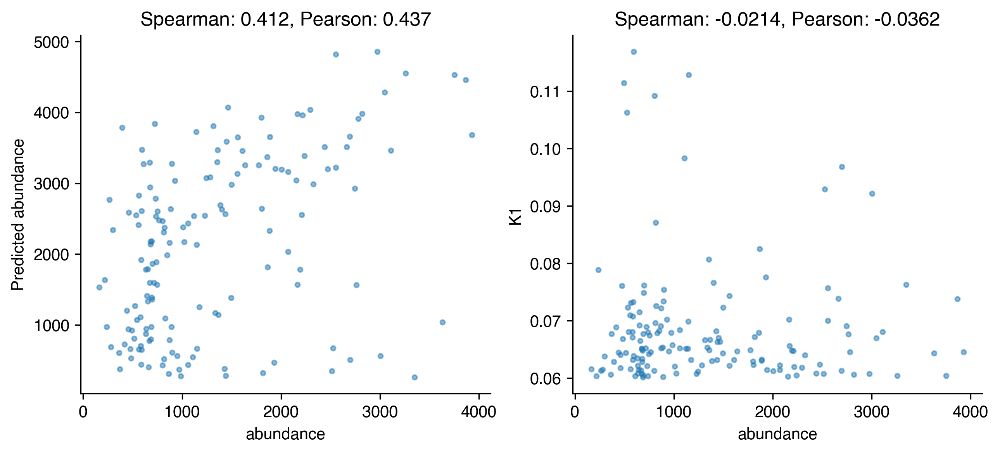

In [ ]:
subset = tile_data[tile_data["K1"] > 0.06]

fig, axs = plt.subplots(1,2, figsize=(10,4))

axs[0].scatter(subset['abundance'], subset["pred_abund"], s=8, alpha=0.5)
spearman = spearmanr(subset["abundance"], subset["pred_abund"]).correlation
pearson = pearsonr(subset["abundance"], subset["pred_abund"]).correlation

axs[0].set_xlabel("abundance")
axs[0].set_ylabel("Predicted abundance")
axs[0].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

axs[1].scatter(subset['abundance'], subset["K1"], s=8, alpha=0.5)
spearman = spearmanr(subset["abundance"], subset["K1"]).correlation
pearson = pearsonr(subset["abundance"], subset["K1"]).correlation

axs[1].set_xlabel("abundance")
axs[1].set_ylabel("K1")
axs[1].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

sns.despine()

In [20]:
finches = pd.read_csv("~/Documents/grad_school/staller_lab/Data/finches_predictions_tiles.csv", index_col=0).drop(["activity", "abundance", "ratio"], axis=1)

In [21]:
merged = finches.merge(tile_data, on='aa_seq')
merged

,aa_seq,epsilon,gal11_attractive,gal11_repulsive,gal11_epsilon,activity,abundance,ratio,pred_activity,pred_abund,K1
0,LSLNEDNENNDDDADDADDDDDALVPREDTIEALLLEPSP,25.211815,-2.039372,1.289017,-2.404940,478.549699,3346.927731,16520.391185,6015.794922,6308.082031,0.025175
1,FGDDNDDGVAIAGATSKEPMLSLNEDNENNDDDADDADDD,24.630535,-0.979922,1.232374,-2.171039,369.470321,3476.590275,17450.773233,280.349731,13069.911133,0.000044
2,DDGVAIAGATSKEPMLSLNEDNENNDDDADDADDDDDALV,24.520996,-1.281970,1.349448,-1.766541,270.500000,3819.553175,19215.215374,271.887207,12682.868164,0.000029
3,SKEPMLSLNEDNENNDDDADDADDDDDALVPREDTIEALL,23.948836,-2.026954,1.293153,-2.060929,256.000000,3995.559677,21013.895756,3588.466309,6497.976074,0.013251
4,IAGATSKEPMLSLNEDNENNDDDADDADDDDDALVPREDT,23.108641,-1.767642,1.305879,-1.784286,537.765650,3343.952558,15573.428663,1271.832886,11480.703125,0.002119
...,...,...,...,...,...,...,...,...,...,...,...
17727,TWGKLSALEYLTICAIVITMGAWDFVIGILIGVVLACVSL,-22.953800,-0.273262,0.321569,-0.032557,256.000000,516.068073,62026.068967,1679.866943,810.753052,0.064357
17728,ETLAELFEPGTLILWLIPLLLAVLLIFLQRFIKSPMFMPL,-27.250756,-0.464652,0.110261,-0.844109,904.673598,1108.600982,55342.784155,1379.735962,549.988831,0.098308
17729,LIPLLLAVLLIFLQRFIKSPMFMPLYFMAIPAVFYVIVVG,-29.146216,-0.755773,0.048374,-0.778863,1633.771812,525.371213,69310.917455,4190.047852,1271.916504,0.106275
17730,LFEPGTLILWLIPLLLAVLLIFLQRFIKSPMFMPLYFMAI,-30.754796,-0.573443,0.122781,-1.060895,270.500000,591.903756,54775.253625,1999.289551,651.037720,0.116859


In [23]:
tile_data.to_csv("tile_data_w_Ks.csv")

Text(0.5, 1.0, 'Spearman: -0.57, Pearson: -0.602')

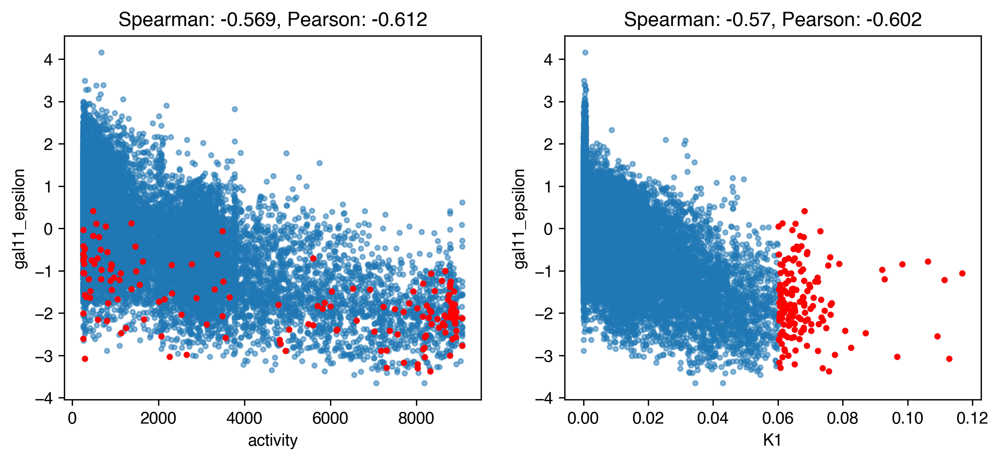

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(10,4))
subset = merged[merged["K1"] > 0.06]

axs[0].scatter(merged['activity'], merged['gal11_epsilon'], s=8, alpha=0.5)
axs[0].scatter(subset['activity'], subset['gal11_epsilon'], s=8, color='red')

spearman = spearmanr(merged.dropna()['gal11_epsilon'], merged.dropna()['activity']).correlation
pearson = pearsonr(merged.dropna()['gal11_epsilon'], merged.dropna()['activity']).correlation

axs[0].set_ylabel("gal11_epsilon")
axs[0].set_xlabel("activity")
axs[0].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

axs[1].scatter(merged['K1'], merged['gal11_epsilon'], s=8, alpha=0.5)
axs[1].scatter(subset['K1'], subset['gal11_epsilon'], s=8, color='red')
spearman = spearmanr(merged.dropna()['gal11_epsilon'], merged.dropna()['K1']).correlation
pearson = pearsonr(merged.dropna()['gal11_epsilon'], merged.dropna()['K1']).correlation

axs[1].set_ylabel("gal11_epsilon")
axs[1].set_xlabel("K1")
axs[1].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

Text(0.5, 1.0, 'Spearman: -0.109, Pearson: -0.123')

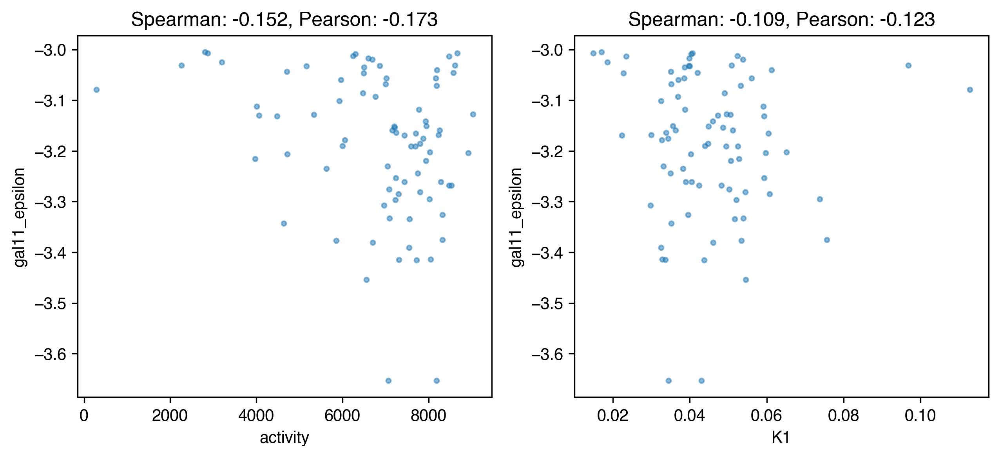

In [174]:
fig, axs = plt.subplots(1,2, figsize=(10,4))
subset = merged[merged["gal11_epsilon"] < -3]

axs[0].scatter(subset['activity'], subset['gal11_epsilon'], s=8, alpha=0.5)
spearman = spearmanr(subset.dropna()['gal11_epsilon'], subset.dropna()['activity']).correlation
pearson = pearsonr(subset.dropna()['gal11_epsilon'], subset.dropna()['activity']).correlation

axs[0].set_ylabel("gal11_epsilon")
axs[0].set_xlabel("activity")
axs[0].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

# subset = merged[merged["K1"] > 0.03]
axs[1].scatter(subset['K1'], subset['gal11_epsilon'], s=8, alpha=0.5)
spearman = spearmanr(subset.dropna()['gal11_epsilon'], subset.dropna()['K1']).correlation
pearson = pearsonr(subset.dropna()['gal11_epsilon'], subset.dropna()['K1']).correlation

axs[1].set_ylabel("gal11_epsilon")
axs[1].set_xlabel("K1")
axs[1].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")



In [125]:
merged['gal11_epsilon'] = merged['gal11_epsilon'].astype('float')

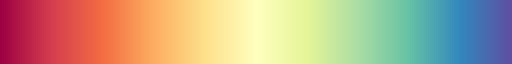

In [144]:
sns.color_palette("Spectral", as_cmap=True)

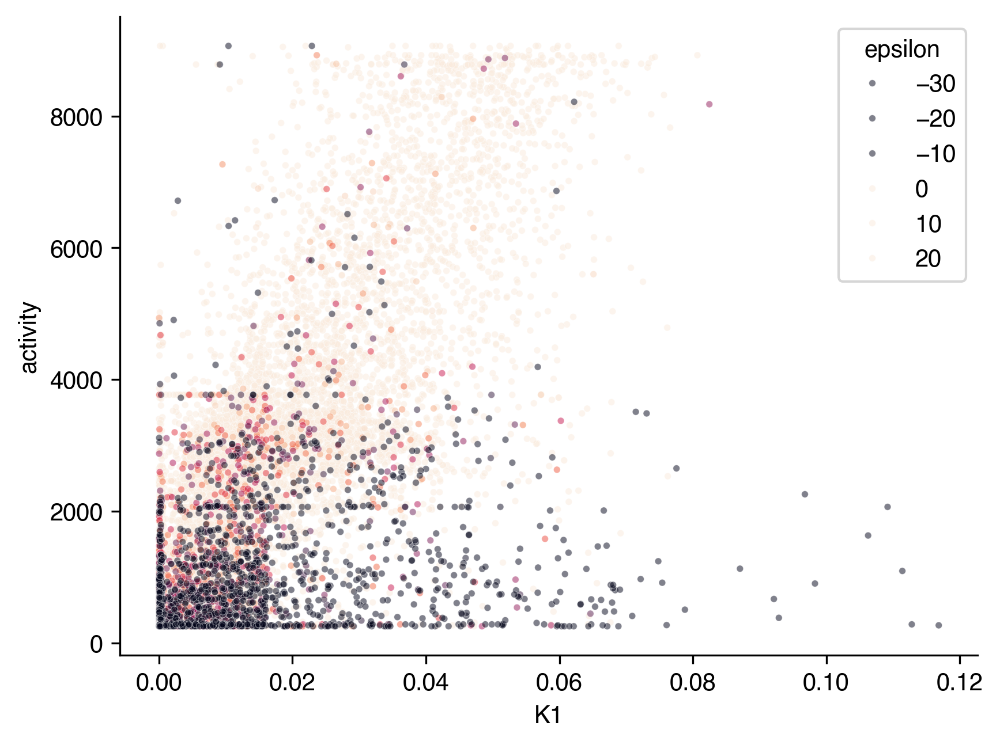

In [187]:
sns.scatterplot(data=merged, x="K1", y='activity', hue='epsilon', s=8, palette='rocket', hue_norm=(-3, 0), alpha=0.5)
sns.despine()

Text(0.5, 1.0, 'Spearman: 0.123, Pearson: 0.148')

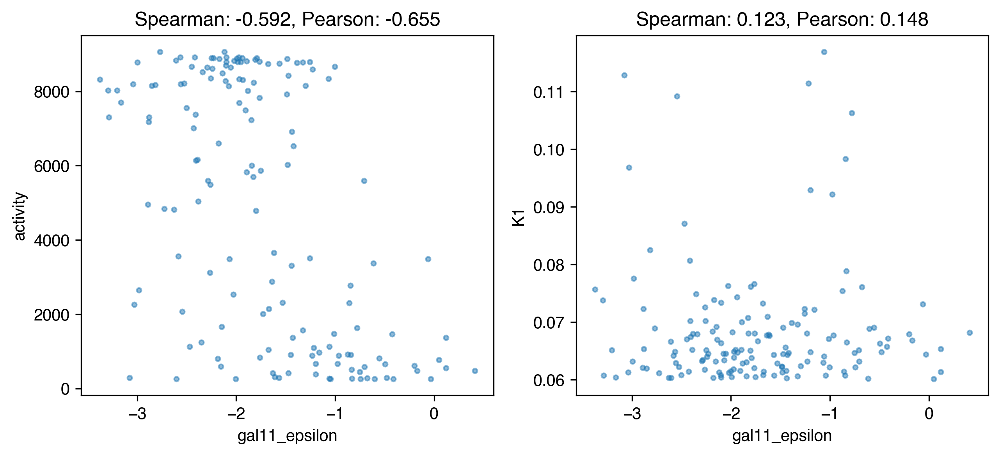

In [103]:
subset = merged[merged["K1"] > 0.06]
fig, axs = plt.subplots(1,2, figsize=(10,4))
axs[0].scatter(subset['gal11_epsilon'], subset['activity'], s=8, alpha=0.5)

spearman = spearmanr(subset.dropna()['gal11_epsilon'], subset.dropna()['activity']).correlation
pearson = pearsonr(subset.dropna()['gal11_epsilon'], subset.dropna()['activity']).correlation

axs[0].set_xlabel("gal11_epsilon")
axs[0].set_ylabel("activity")
axs[0].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

axs[1].scatter(subset['gal11_epsilon'], subset['K1'], s=8, alpha=0.5)

spearman = spearmanr(subset.dropna()['gal11_epsilon'], subset.dropna()['K1']).correlation
pearson = pearsonr(subset.dropna()['gal11_epsilon'], subset.dropna()['K1']).correlation

axs[1].set_xlabel("gal11_epsilon")
axs[1].set_ylabel("K1")
axs[1].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")



Text(0.5, 1.0, 'Spearman: -0.227, Pearson: -0.238')

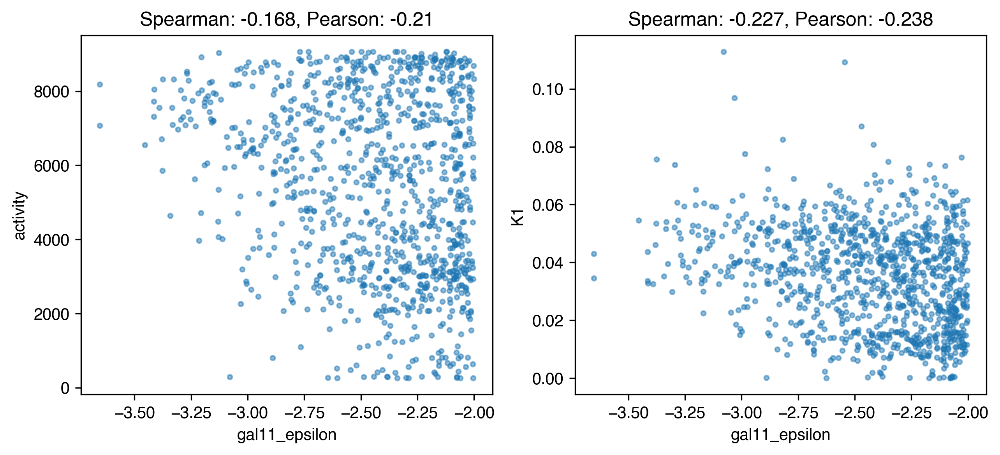

In [105]:
subset = merged[merged["gal11_epsilon"] < -2]
fig, axs = plt.subplots(1,2, figsize=(10,4))
axs[0].scatter(subset['gal11_epsilon'], subset['activity'], s=8, alpha=0.5)

spearman = spearmanr(subset.dropna()['gal11_epsilon'], subset.dropna()['activity']).correlation
pearson = pearsonr(subset.dropna()['gal11_epsilon'], subset.dropna()['activity']).correlation

axs[0].set_xlabel("gal11_epsilon")
axs[0].set_ylabel("activity")
axs[0].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

axs[1].scatter(subset['gal11_epsilon'], subset['K1'], s=8, alpha=0.5)

spearman = spearmanr(subset.dropna()['gal11_epsilon'], subset.dropna()['K1']).correlation
pearson = pearsonr(subset.dropna()['gal11_epsilon'], subset.dropna()['K1']).correlation

axs[1].set_xlabel("gal11_epsilon")
axs[1].set_ylabel("K1")
axs[1].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")



Text(0.5, 1.0, 'Spearman: 0.233, Pearson: 0.0835')

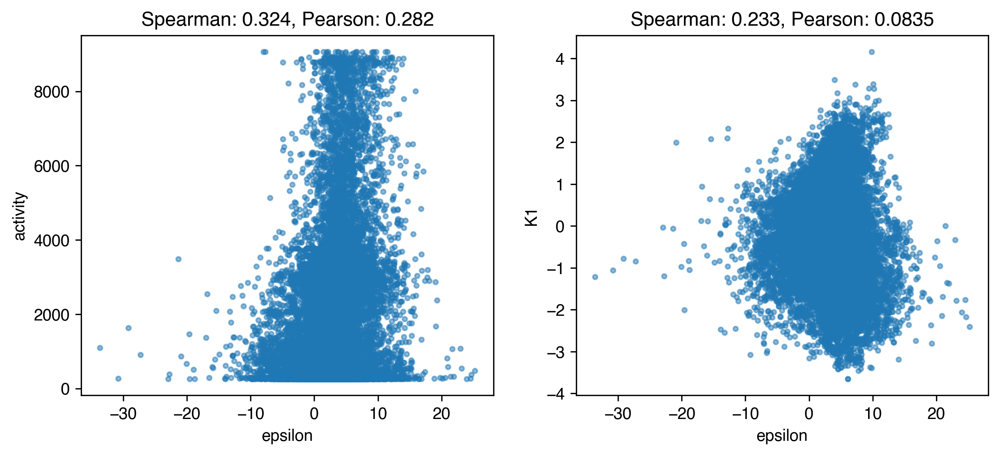

In [189]:

fig, axs = plt.subplots(1,2, figsize=(10,4))
axs[0].scatter(merged['epsilon'], merged['activity'], s=8, alpha=0.5)

spearman = spearmanr(merged.dropna()['epsilon'], merged.dropna()['activity']).correlation
pearson = pearsonr(merged.dropna()['epsilon'], merged.dropna()['activity']).correlation

axs[0].set_xlabel("epsilon")
axs[0].set_ylabel("activity")
axs[0].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

axs[1].scatter(merged['epsilon'], merged['gal11_epsilon'], s=8, alpha=0.5)

spearman = spearmanr(merged.dropna()['epsilon'], merged.dropna()['K1']).correlation
pearson = pearsonr(merged.dropna()['epsilon'], merged.dropna()['K1']).correlation

axs[1].set_xlabel("epsilon")
axs[1].set_ylabel("K1")
axs[1].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")



Text(0.5, 1.0, 'Spearman: -0.0594, Pearson: -0.0684')

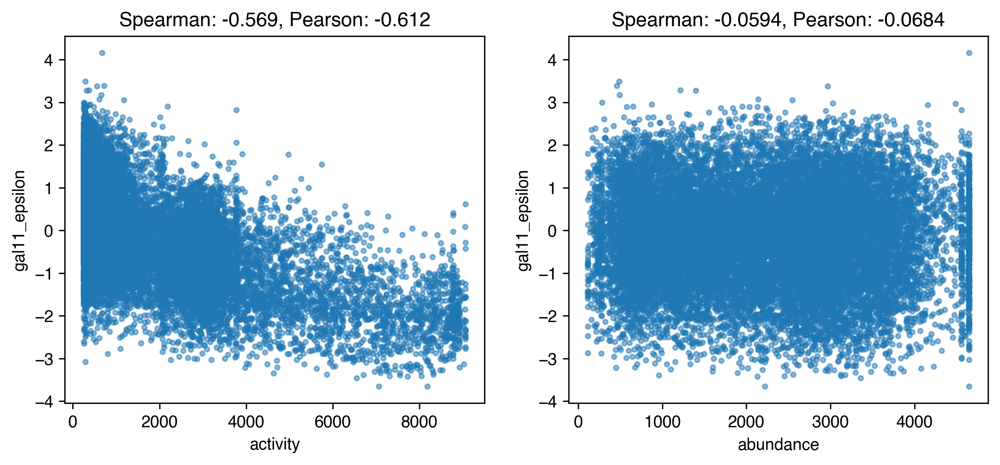

In [177]:
fig, axs = plt.subplots(1,2, figsize=(10,4))
# subset = merged[merged["gal11_epsilon"] < -3]

axs[0].scatter(merged['activity'], merged['gal11_epsilon'], s=8, alpha=0.5)
spearman = spearmanr(merged.dropna()['gal11_epsilon'], merged.dropna()['activity']).correlation
pearson = pearsonr(merged.dropna()['gal11_epsilon'], merged.dropna()['activity']).correlation

axs[0].set_ylabel("gal11_epsilon")
axs[0].set_xlabel("activity")
axs[0].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

# subset = merged[merged["K1"] > 0.03]
axs[1].scatter(merged['abundance'], merged['gal11_epsilon'], s=8, alpha=0.5)
spearman = spearmanr(merged.dropna()['gal11_epsilon'], merged.dropna()['abundance']).correlation
pearson = pearsonr(merged.dropna()['gal11_epsilon'], merged.dropna()['abundance']).correlation

axs[1].set_ylabel("gal11_epsilon")
axs[1].set_xlabel("abundance")
axs[1].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")



In [1]:
merged

NameError: name 'merged' is not defined

Text(0.5, 1.0, 'Spearman: -0.57, Pearson: -0.602')

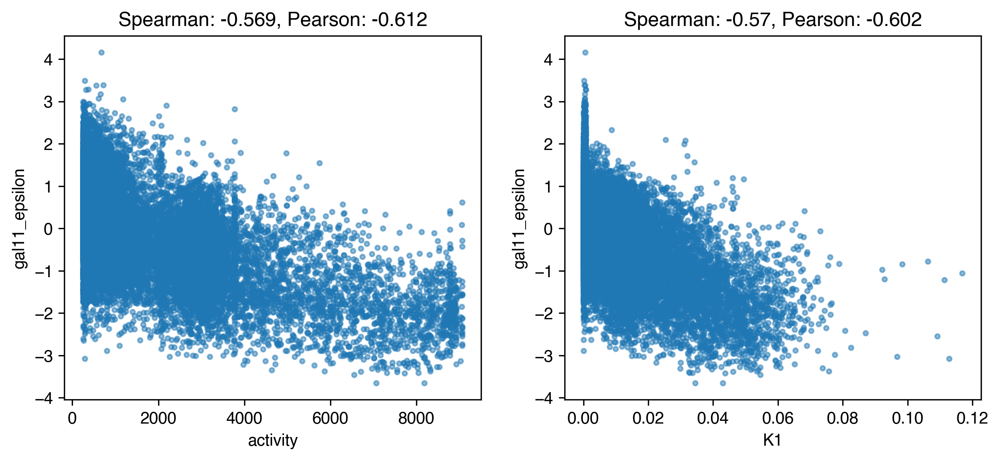

In [190]:
fig, axs = plt.subplots(1,2, figsize=(10,4))
# subset = merged[merged["gal11_epsilon"] < -3]

axs[0].scatter(merged['activity'], merged['gal11_epsilon'], s=8, alpha=0.5)
spearman = spearmanr(merged.dropna()['gal11_epsilon'], merged.dropna()['activity']).correlation
pearson = pearsonr(merged.dropna()['gal11_epsilon'], merged.dropna()['activity']).correlation

axs[0].set_ylabel("gal11_epsilon")
axs[0].set_xlabel("activity")
axs[0].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

# subset = merged[merged["K1"] > 0.03]
axs[1].scatter(merged['K1'], merged['gal11_epsilon'], s=8, alpha=0.5)
spearman = spearmanr(merged.dropna()['gal11_epsilon'], merged.dropna()['K1']).correlation
pearson = pearsonr(merged.dropna()['gal11_epsilon'], merged.dropna()['K1']).correlation

axs[1].set_ylabel("gal11_epsilon")
axs[1].set_xlabel("K1")
axs[1].set_title(f"Spearman: {spearman:.3}, Pearson: {pearson:.3}")

